In [1]:
import numpy as np
import librosa
import IPython.display
import matplotlib.pyplot as plt

In [16]:
def outSpec(x,win_length,hop_length,normalize=False):
    '''
    スペクトラルを計算

    Parameters
    ----------
    x (numpy.array) : signal (monoral)
    win_length (int) : stft window size
    hop_length (int) : stft window stride
    normalize (bool) :

    Returns
    -------
    D : spec
    '''
    x = x.squeeze()
    if normalize:
        x = np.double(x)/np.mean(x)
    # Save as complex valued output for mixing later
    D = librosa.stft(x.squeeze(),n_fft=win_length,hop_length=hop_length)
    return D


In [4]:
# Input must be raw STFT (complex values)
def calcPower(S):
    '''
    スペクトルパワーを計算し、それを周波数方向に積分し、そのmedian値を返す。

    Parameters
    ----------
    S : スペクトラル

    Returns
    -------
    パワーのメジアン値

    '''
    return np.median(20 * np.log10(np.sum(np.abs(S), axis=0)))

In [340]:
def cut_silence_section(signal, top_db=60):
    index_array = librosa.effects.split(signal, ref=np.max, top_db=top_db)
    signal_ = []
    for index in index_array:
        signal_.extend(signal[index[0]:index[1]])
    signal_ = np.array(signal_)
    return signal_

In [438]:
def align_audio_length(signal_1, signal_2):
    while len(signal_2) < len(signal_1):
            signal_2 = np.concatenate((signal_2,signal_2),axis=0)
    signal_2 = signal_2[:len(signal_1)]
    return signal_2

In [398]:
# 異音を調整する係数を算出する
def calcScaler(S_norm,S_anom,anr):
    P_norm = calcPower(S_norm)
    P_anom = calcPower(S_anom)
    alpha = anr - (P_anom-P_norm)
    alpha = 10**(alpha/20)
    return alpha

In [457]:
def wave_mixing(norm,anom,anr, top_db=20):
    norm_=norm.squeeze()
    anom_=anom.squeeze()
    norm, anom = cut_silence_section(norm, top_db=top_db), cut_silence_section(anom, top_db=top_db)

    D_norm = outSpec(norm_, win_length=512, hop_length=256)
    D_anom = outSpec(anom_, win_length=512, hop_length=256)
    scaler = calcScaler(D_norm, D_anom, anr=anr)

    return scaler*anom_+norm_

In [266]:
def display_audio(signal,sr):
    display(IPython.display.Audio(signal, rate=sr, normalize=False))
    fis, ax = plt.subplots(2,1,figsize=(18,10))
    librosa.display.waveplot(signal, sr=sr, ax=ax[0])
    D = librosa.amplitude_to_db(np.abs(librosa.stft(signal)), ref=np.max)
    librosa.display.specshow(D, y_axis='log', sr=sr, x_axis='time', ax=ax[1])

<br>

音声ファイルの読み込み

In [429]:
norm , sr = librosa.load('data/nomal_sound/motor_1.wav', sr=None)
anom_sample , sr = librosa.load('data/anomaly_sample/glass-creaking_trim.wav', sr=None)

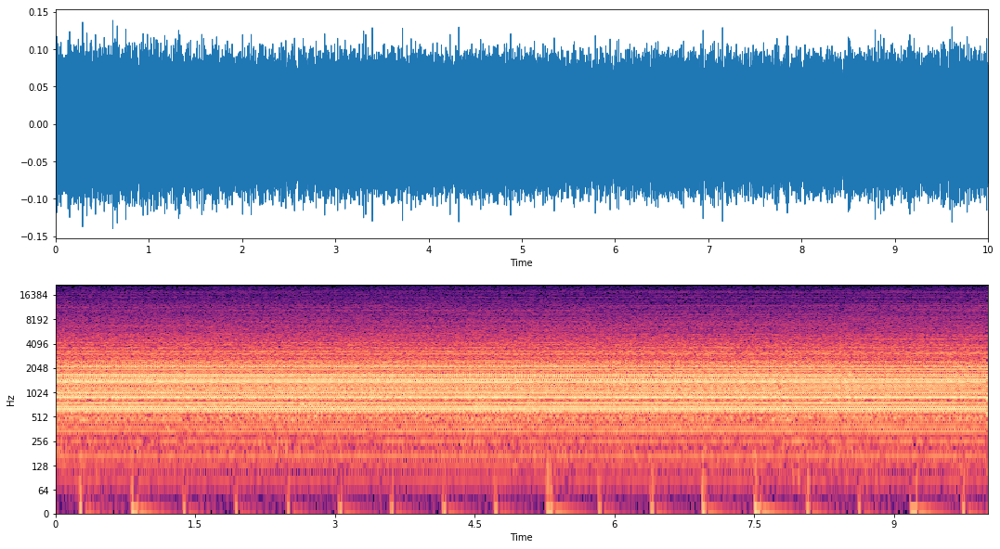

In [430]:
display_audio(norm, sr)

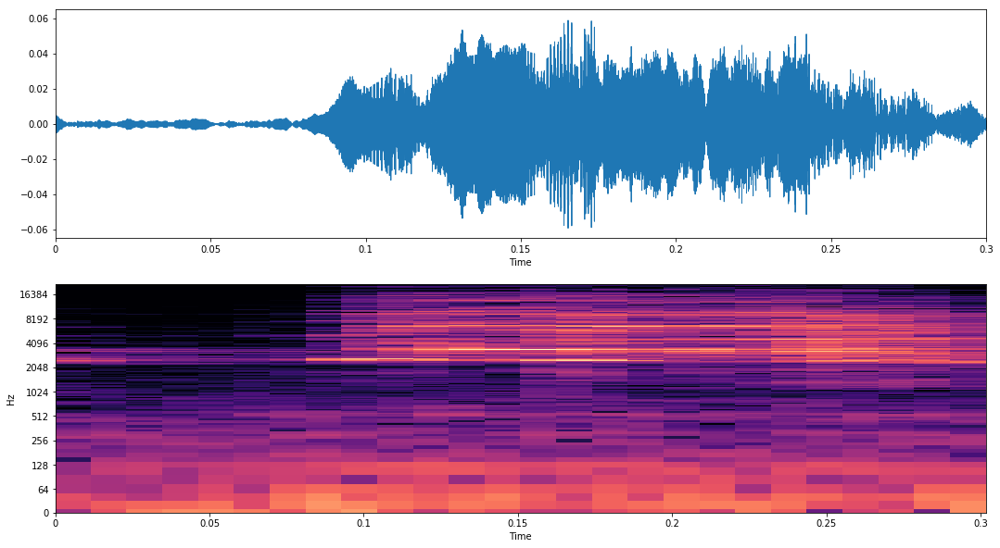

In [432]:
display_audio(anom_sample, sr)

<br>

異常サンプル音を正常音の長さに揃える

In [458]:
anom_sample = align_audio_length(norm, anom_sample)

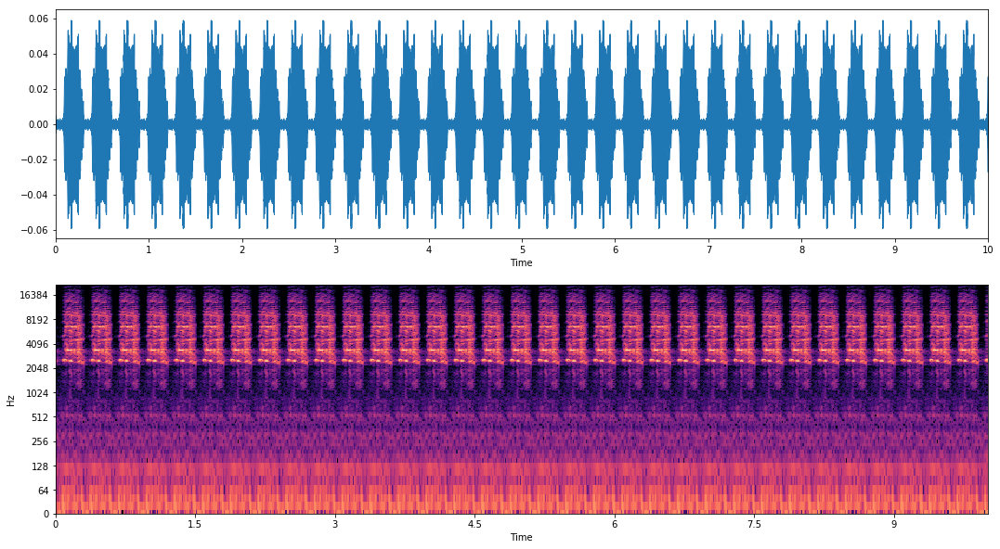

In [459]:
display_audio(anom_sample, sr)

<br>

無音区間の削除(確認)

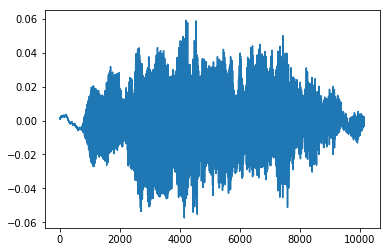

In [417]:
plt.plot(cut_silence_section(anom_1, top_db=20))

<br>

疑似異常音の作成

32.679905 23.53283
0.5097459484951342


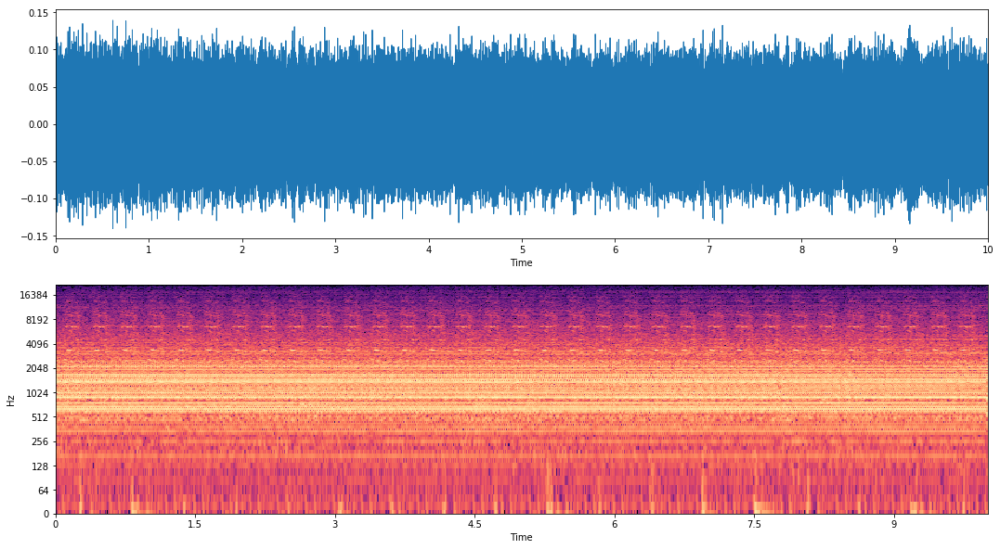

In [456]:
anom = wave_mixing(norm, anom_sample, anr=-15, top_db=20)
display_audio(anom, sr=sr)

32.679905 23.53283
0.28665121218716516


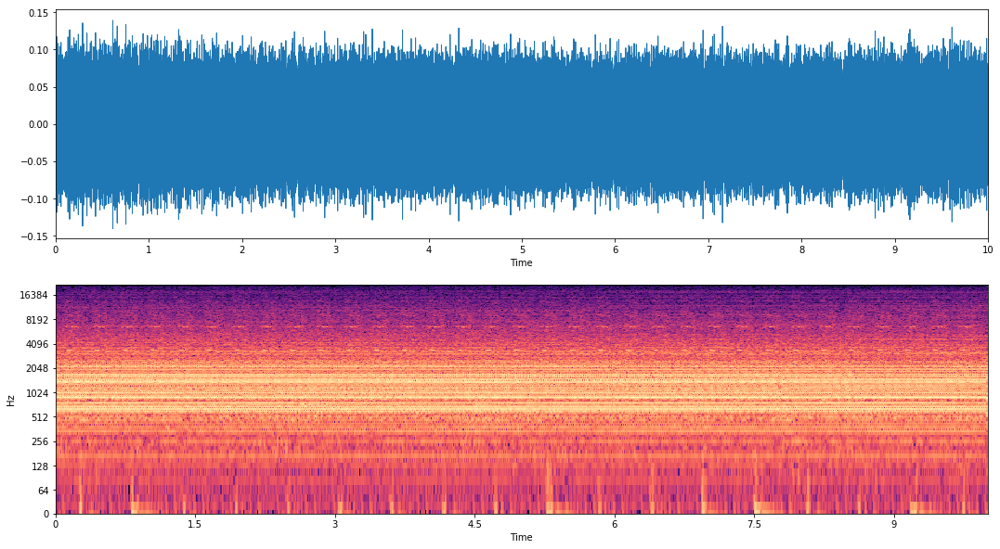

In [422]:
anom = wave_mixing(norm_1, anom_1, anr=-20, top_db=20)
display_audio(anom, sr=sr)

32.679905 23.53283
0.16119582252875042


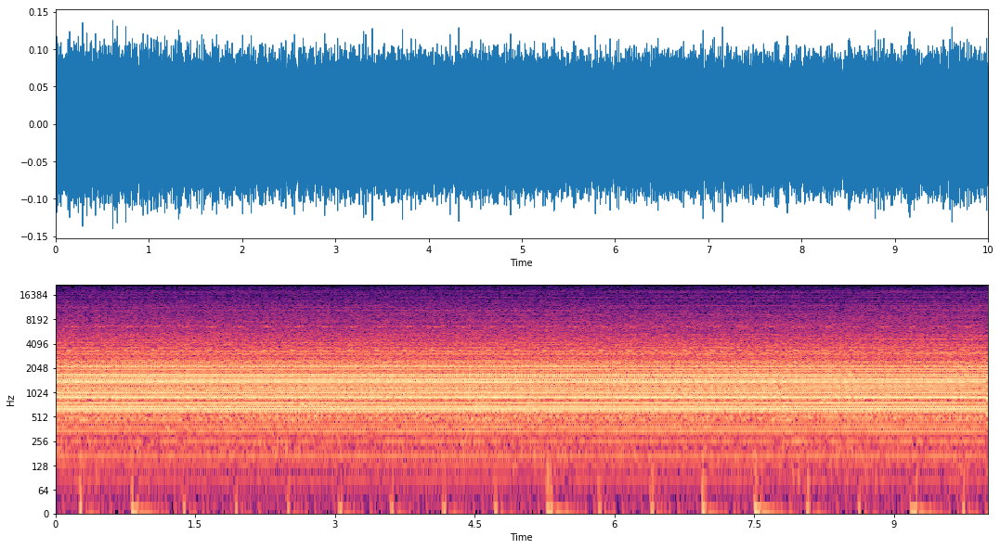

In [424]:
anom = wave_mixing(norm_1, anom_1, anr=-25, top_db=20)
display_audio(anom, sr=sr)

32.679905 23.53283
0.09064707245596583


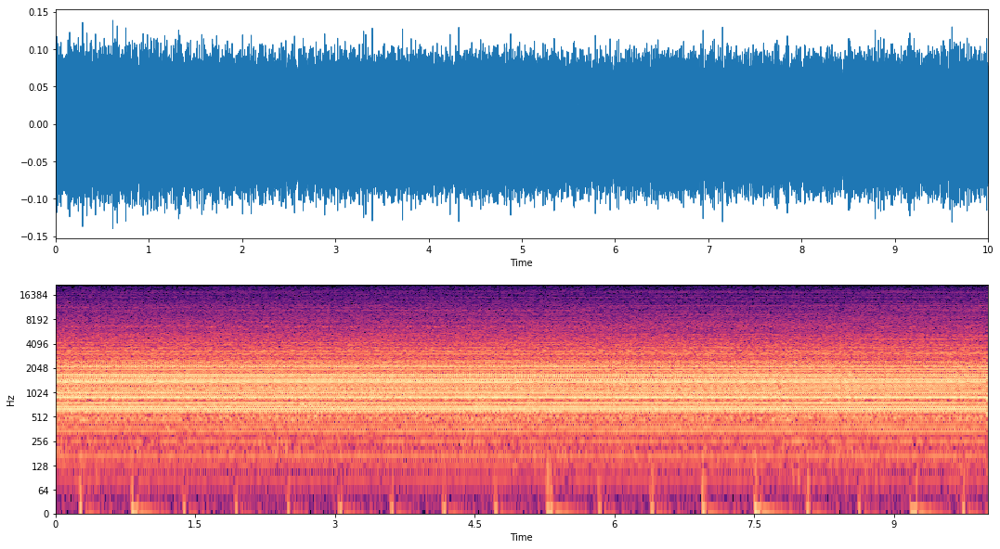

In [425]:
anom = wave_mixing(norm_1, anom_1, anr=-30, top_db=20)
display_audio(anom, sr=sr)

32.679905 23.53283
2.8665121218716533e-05


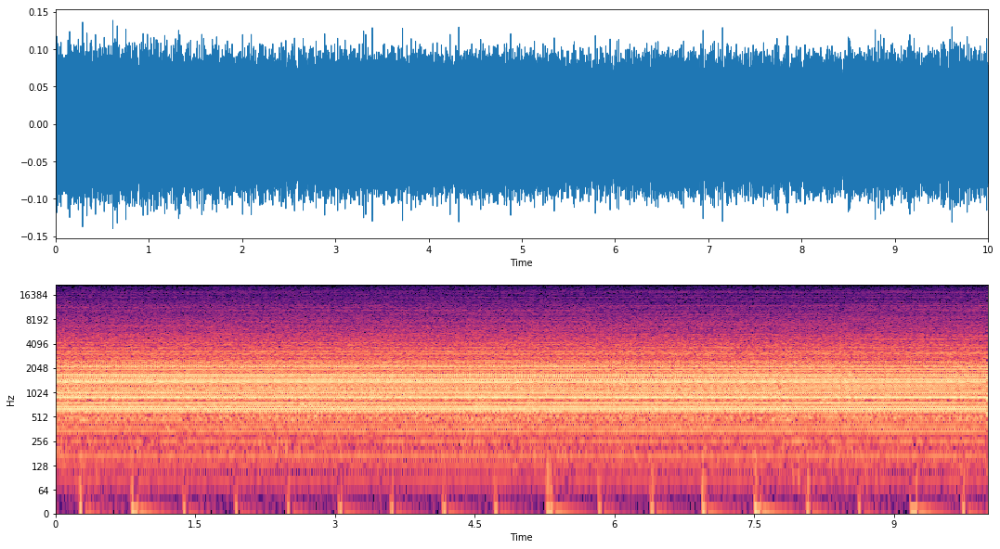

In [421]:
anom = wave_mixing(norm_1, anom_1, anr=-100)
display_audio(anom, sr=sr)